Source notebook https://colab.research.google.com/drive/1xM6UZ9OdpGDnHBljZ0RglHV_kBrZ4e-9

Rerun with data from https://www.kaggle.com/ikarus777/best-artworks-of-all-time

This notebook aims at **Model Interpretability** using **TF2.0**. Machine learning models, especially Deep Learning models are often considered as a black box and hard to interpret. Well, this statement is neither completely true nor it is completely false. It is a fact that debugging a deep learning model is way harder than other machine learning models but there are ways by which you can get insights about your model and to an extent, you can see what is happening.

In [2]:
pip install tensorflow-gpu

Upload your **`kaggle.json`** file 
so that you can download the dataset.

In [80]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle.json': b'{"username":"robmarkcole","key":"79d30e3c096cd8da8cef6127f735ed2d"}'}

In [81]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


We have uploaded the json file. Now we are ready to download the dataset. We will be using the [10 Monkey Species](https://www.kaggle.com/slothkong/10-monkey-species) dataset for this experiment. Let's download and unzip our dataset

In [4]:
!kaggle datasets download -d ikarus777/best-artworks-of-all-time

100% 2.15G/2.16G [00:37<00:00, 33.1MB/s]
100% 2.16G/2.16G [00:37<00:00, 61.7MB/s]


In [0]:
!unzip -qq best-artworks-of-all-time.zip

In [0]:
!unzip -qq images.zip
!unzip -qq resized.zip

Images are in folders with the name of the artist

## Import the required libraries

In [0]:
import warnings 
warnings.filterwarnings("ignore")

In [0]:
import os
import glob
import cv2
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import shuffle

from PIL import Image

from skimage.io import imread, imsave
from skimage.transform import resize 
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras import layers as L
from tensorflow.keras.applications import vgg16
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import SGD, Adam, RMSprop

import tensorflow as tf
import tensorflow.keras.backend as K

import imgaug as ia
from imgaug import augmenters as iaa

In [5]:
tf.__version__

'2.0.0'

In [0]:
def plotImages(artist, directory):
    """Plot 25 images of an artist."""
    multipleImages = glob.glob(directory)
    print(f"{artist} has {len(multipleImages)} images")
    plt.rcParams['figure.figsize'] = (12, 12)
    plt.subplots_adjust(wspace=0, hspace=0)
    i_ = 0
    for l in multipleImages[:25]:
        im = cv2.imread(l)
        
        # Shrink image if too large
        try:
            im = cv2.resize(im, (128, 128))
            plt.subplot(5, 5, i_+1) #.set_title(l)
            plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)); plt.axis('off')
        except:
            print(l)
            pass
        i_ += 1
    plt.savefig(f"{artist}.jpg")


In [0]:
%config InlineBackend.figure_format="svg"
%matplotlib inline


# Reproducibility is importatnt. Always set the seed!
seed=1234
np.random.seed(seed)
tf.random.set_seed(seed)
ia.seed(seed)

## EDA
I am particularly interested identifying differences between impressionist and renaissance artists. The `artists.csv` provides into about each of the 50 artists

In [0]:
df = pd.read_csv('artists.csv', index_col=0)

In [9]:
df.head()

,name,years,genre,nationality,bio,wikipedia,paintings
id,,,,,,,
0,Amedeo Modigliani,1884 - 1920,Expressionism,Italian,Amedeo Clemente Modigliani (Italian pronunciat...,http://en.wikipedia.org/wiki/Amedeo_Modigliani,193
1,Vasiliy Kandinskiy,1866 - 1944,"Expressionism,Abstractionism",Russian,Wassily Wassilyevich Kandinsky (Russian: Васи́...,http://en.wikipedia.org/wiki/Wassily_Kandinsky,88
2,Diego Rivera,1886 - 1957,"Social Realism,Muralism",Mexican,Diego María de la Concepción Juan Nepomuceno E...,http://en.wikipedia.org/wiki/Diego_Rivera,70
3,Claude Monet,1840 - 1926,Impressionism,French,Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...,http://en.wikipedia.org/wiki/Claude_Monet,73
4,Rene Magritte,1898 - 1967,"Surrealism,Impressionism",Belgian,René François Ghislain Magritte (French: [ʁəne...,http://en.wikipedia.org/wiki/René_Magritte,194


In [10]:
genres = list(df['genre'].unique())
print(len(genres))
sorted(genres)

31


['Abstract Expressionism',
 'Baroque',
 'Byzantine Art',
 'Cubism',
 'Early Renaissance',
 'Expressionism',
 'Expressionism,Abstractionism',
 'Expressionism,Abstractionism,Surrealism',
 'High Renaissance',
 'High Renaissance,Mannerism',
 'Impressionism',
 'Impressionism,Post-Impressionism',
 'Mannerism',
 'Neoplasticism',
 'Northern Renaissance',
 'Pop Art',
 'Post-Impressionism',
 'Primitivism',
 'Primitivism,Surrealism',
 'Proto Renaissance',
 'Realism',
 'Realism,Impressionism',
 'Romanticism',
 'Social Realism,Muralism',
 'Suprematism',
 'Surrealism',
 'Surrealism,Impressionism',
 'Symbolism',
 'Symbolism,Art Nouveau',
 'Symbolism,Expressionism',
 'Symbolism,Post-Impressionism']

In [11]:
impressionists = df[(df['genre'] == 'Impressionism') | 
                    (df['genre'] == 'Realism,Impressionism') |
                    (df['genre'] == 'Impressionism,Post-Impressionism')]

impressionists = impressionists.sort_values(by=["paintings"], ascending=False)
impressionists

,name,years,genre,nationality,bio,wikipedia,paintings
id,,,,,,,
30,Edgar Degas,1834 - 1917,Impressionism,French,Edgar Degas (US: or UK: ; born Hilaire-Germai...,http://en.wikipedia.org/wiki/Edgar_Degas,702
15,Pierre-Auguste Renoir,1841 - 1919,Impressionism,French,"Pierre-Auguste Renoir, commonly known as Augus...",http://en.wikipedia.org/wiki/Pierre-Auguste_Re...,336
20,Alfred Sisley,1839 - 1899,Impressionism,"French,British",Alfred Sisley (; French: [sislɛ]; 30 October 1...,http://en.wikipedia.org/wiki/Alfred_Sisley,259
28,Henri Matisse,1869 - 1954,"Impressionism,Post-Impressionism",French,Henri Émile Benoît Matisse (French: [ɑ̃ʁi emil...,http://en.wikipedia.org/wiki/Henri_Matisse,186
35,Camille Pissarro,1830 - 1903,"Impressionism,Post-Impressionism",French,Camille Pissarro (French: [kamij pisaʁo]; 10 J...,https://en.wikipedia.org/wiki/Camille_Pissarro,91
6,Edouard Manet,1832 - 1883,"Realism,Impressionism",French,Édouard Manet (US: ; UK: ; French: [edwaʁ manɛ...,http://en.wikipedia.org/wiki/Édouard_Manet,90
3,Claude Monet,1840 - 1926,Impressionism,French,Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...,http://en.wikipedia.org/wiki/Claude_Monet,73


In [12]:
impressionist_artists = impressionists['name'].values.tolist()
impressionist_artists = [artist.replace(" ", "_") for artist in impressionist_artists] # match convention used in folder names
impressionist_artists

['Edgar_Degas',
 'Pierre-Auguste_Renoir',
 'Alfred_Sisley',
 'Henri_Matisse',
 'Camille_Pissarro',
 'Edouard_Manet',
 'Claude_Monet']

## Resized
These are shrunk down images

In [0]:
resized = glob.glob("resized/*.jpg")

In [14]:
len(resized)

8355

In [15]:
Image.open(resized[0]).size

(480, 407)

## Full sized images
Get the paths of all full images 

In [16]:
all_images_folders = glob.glob("images/*")
len(all_images_folders)

50

Filter the impressionist images

In [17]:
impressionist_folders = [dir_ for dir_ in all_images_folders if dir_.split('/')[-1] in  impressionist_artists]
print(len(impressionist_folders))
impressionist_folders

7


['images/Camille_Pissarro',
 'images/Claude_Monet',
 'images/Pierre-Auguste_Renoir',
 'images/Henri_Matisse',
 'images/Alfred_Sisley',
 'images/Edouard_Manet',
 'images/Edgar_Degas']

Get list of all impressionist images

In [18]:
impressionist_images = []
for folder in impressionist_folders:
  impressionist_images.extend(glob.glob(folder + "/*.jpg", recursive=True))

len(impressionist_images)

1737

Note that images are full size

In [19]:
img_1 = Image.open(impressionist_images[0])
img_1.size

(1227, 1024)

In [0]:
impressioninst_df = pd.DataFrame(impressionist_images)

In [0]:
impressioninst_df.columns = ['filename']

In [0]:
impressioninst_df['genre'] = 'impressionist'

In [23]:
impressioninst_df.head()

,filename,genre,label
0,images/Camille_Pissarro/Camille_Pissarro_68.jpg,impressionist,1
1,images/Camille_Pissarro/Camille_Pissarro_52.jpg,impressionist,1
2,images/Camille_Pissarro/Camille_Pissarro_85.jpg,impressionist,1
3,images/Camille_Pissarro/Camille_Pissarro_25.jpg,impressionist,1
4,images/Camille_Pissarro/Camille_Pissarro_24.jpg,impressionist,1


Camille_Pissarro has 91 images


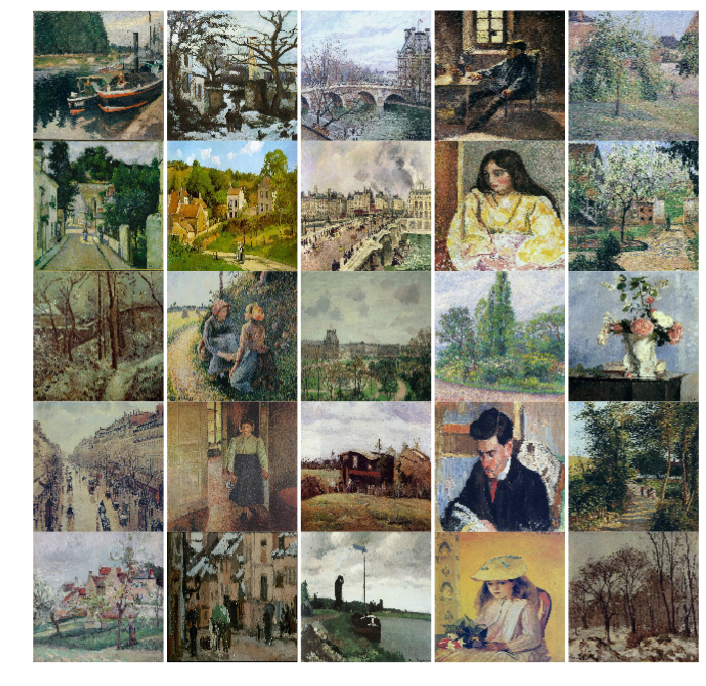

In [24]:
artist_index = 0
folder = impressionist_folders[artist_index]
artist = folder.split("/")[-1]
plotImages(artist,  folder+'/*.jpg')

## Renaissance artists

In [25]:
renaissance = df[(df['genre'] == 'Early Renaissance') | 
                    (df['genre'] == 'High Renaissance') |
                    (df['genre'] == 'Northern Renaissance') |
                    (df['genre'] == 'Proto Renaissance') |
                    (df['genre'] == 'High Renaissance,Mannerism')]

renaissance = renaissance.sort_values(by=["paintings"], ascending=False)
renaissance

,name,years,genre,nationality,bio,wikipedia,paintings
id,,,,,,,
19,Albrecht Dürer,1471 - 1528,Northern Renaissance,German,Albrecht Dürer (; German: [ˈʔalbʁɛçt ˈdyːʁɐ]; ...,http://en.wikipedia.org/wiki/Albrecht_Dürer,328
32,Titian,1488 - 1576,"High Renaissance,Mannerism",Italian,Tiziano Vecelli or Tiziano Vecellio (pronounce...,http://en.wikipedia.org/wiki/Titian,255
24,Sandro Botticelli,1445 - 1510,Early Renaissance,Italian,"Alessandro (c. 1445 – May 17, 1510), known as ...",http://en.wikipedia.org/wiki/Sandro_Botticelli,164
26,Leonardo da Vinci,1452 - 1519,High Renaissance,Italian,Leonardo di ser Piero da Vinci (Italian: [leoˈ...,http://en.wikipedia.org/wiki/Leonardo_da_Vinci,143
10,Hieronymus Bosch,1450 - 1516,Northern Renaissance,Dutch,Hieronymus Bosch ( (listen); Dutch: [ɦijeːˈroː...,http://en.wikipedia.org/wiki/Hieronymus_Bosch,137
21,Pieter Bruegel,1525 - 1569,Northern Renaissance,Flemish,Pieter Bruegel (also Brueghel) the Elder (Dutc...,http://en.wikipedia.org/wiki/Pieter_Bruegel_th...,134
23,Giotto di Bondone,1266 - 1337,Proto Renaissance,Italian,Giotto di Bondone (Italian pronunciation: [ˈdʒ...,http://en.wikipedia.org/wiki/Giotto_di_Bondone,119
47,Raphael,1483 – 1520,High Renaissance,Italian,Raffaello Sanzio da Urbino (Italian: [raffaˈɛl...,https://en.wikipedia.org/wiki/Raphael,109
29,Jan van Eyck,1395 - 1441,Northern Renaissance,Flemish,Jan van Eyck (Dutch: [ˈjɑn vɑn ˈɛik]) (before ...,http://en.wikipedia.org/wiki/Jan_van_Eyck,81


In [26]:
renaissance_artists = list(renaissance['name'].unique())
print(len(renaissance_artists))

10


In [27]:
renaissance_artists = [artist.replace(" ", "_") for artist in renaissance_artists] # match convention used in folder names
renaissance_artists

['Albrecht_Dürer',
 'Titian',
 'Sandro_Botticelli',
 'Leonardo_da_Vinci',
 'Hieronymus_Bosch',
 'Pieter_Bruegel',
 'Giotto_di_Bondone',
 'Raphael',
 'Jan_van_Eyck',
 'Michelangelo']

In [28]:
renaissance_folders = [dir_ for dir_ in all_images_folders if dir_.split('/')[-1] in  renaissance_artists]
print(len(renaissance_folders))
renaissance_folders

9


['images/Titian',
 'images/Hieronymus_Bosch',
 'images/Raphael',
 'images/Leonardo_da_Vinci',
 'images/Giotto_di_Bondone',
 'images/Sandro_Botticelli',
 'images/Pieter_Bruegel',
 'images/Michelangelo',
 'images/Jan_van_Eyck']

Appears `Albrecht_Dürer` has no images

In [29]:
renaissance_images = []
for folder in renaissance_folders:
  renaissance_images.extend(glob.glob(folder + "/*.jpg", recursive=True))

len(renaissance_images)

1191

In [30]:
renaissance_images[0]

'images/Titian/Titian_186.jpg'

Titian has 255 images


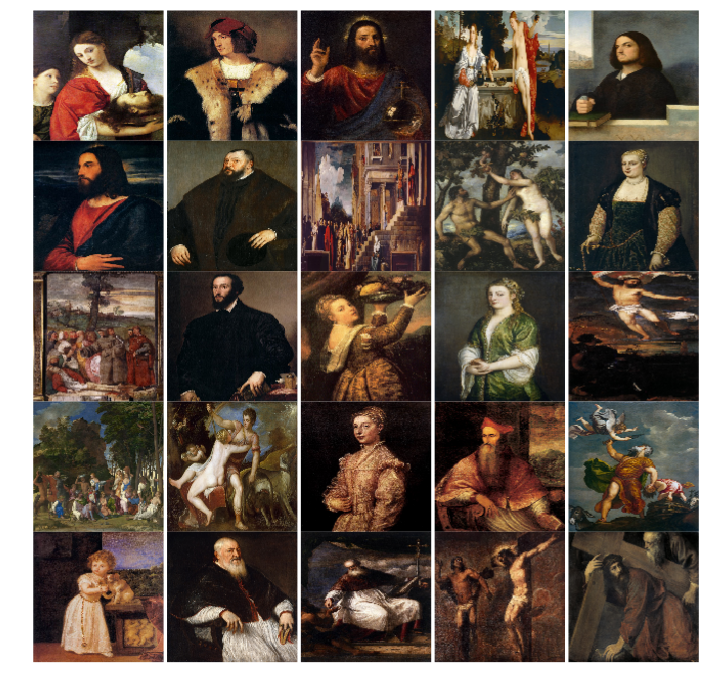

In [31]:
artist_index = 0
folder = renaissance_folders[artist_index]
artist = folder.split("/")[-1]
plotImages(artist,  folder+'/*.jpg')

So we have more impressionist than renaissance images. Lets create a single dataframe with the file names and the renaissance/impresisoninst labels and limit the number of impressionists to match the renaissance

In [0]:
renaissance_df = pd.DataFrame(renaissance_images)

In [0]:
renaissance_df.columns = ['filename']

In [0]:
renaissance_df['genre'] = 'renaissance'

In [35]:
renaissance_df.head()

,filename,genre,label
0,images/Titian/Titian_186.jpg,renaissance,0
1,images/Titian/Titian_105.jpg,renaissance,0
2,images/Titian/Titian_178.jpg,renaissance,0
3,images/Titian/Titian_248.jpg,renaissance,0
4,images/Titian/Titian_76.jpg,renaissance,0


## Combine impressionist and renaissance data

In [0]:
train_df = pd.concat([renaissance_df, impressioninst_df.iloc[0:len(renaissance_df)]])

In [0]:
train_df = shuffle(train_df)

In [72]:
train_df.head()

,filename,genre,label
241,images/Pierre-Auguste_Renoir/Pierre-Auguste_Re...,impressionist,1
508,images/Leonardo_da_Vinci/Leonardo_da_Vinci_35.jpg,renaissance,0
119,images/Titian/Titian_74.jpg,renaissance,0
247,images/Pierre-Auguste_Renoir/Pierre-Auguste_Re...,impressionist,1
862,images/Alfred_Sisley/Alfred_Sisley_142.jpg,impressionist,1


In [73]:
train_df['genre'].describe()

count              2382
unique                2
top       impressionist
freq               1191
Name: genre, dtype: object

## Setup DataGenerator
We will need to resize images as for VG16 The default input size for this model is 224x224.

In [0]:
# dimensions to consider for the images
img_rows, img_cols, img_channels = 224,224,3

In [0]:
VALIDATION_SPLIT = 0.25
datagen = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=VALIDATION_SPLIT)

In [0]:
# We will be using vgg16 as our base network. So we have to apply the same
# preprocessing as used in the original model

In [0]:
# batch size for training  
batch_size=16

# total number of classes in the dataset
nb_classes=2

In [78]:
train_generator=datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="filename",
    y_col="genre",
    subset="training",
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(224,224),
    preprocessing_function=tf.keras.applications.vgg16.preprocess_input
)

Found 1787 validated image filenames belonging to 2 classes.


In [79]:
valid_generator=datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="filename",
    y_col="genre",
    subset="validation",
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(224,224),
    preprocessing_function=tf.keras.applications.vgg16.preprocess_input
)

Found 595 validated image filenames belonging to 2 classes.


## Data Augmentation
When you have limited data, deep models don't do very well. Deep learning models are data hungry. The more data you provide to a deep learning model, the more it performance improves (until unless your algorithm has reached a limit). This is where data augmentation really comes handy. We will be using **[imgaug](https://github.com/aleju/imgaug)**, a very powerful library for augmenting our images. We will define a sequence of augmentations and for each image, one of these augmentations will be applied to the image during training


In [0]:
# Augmentation sequence 
seq = iaa.OneOf([
    iaa.Fliplr(), # horizontal flips
    iaa.Affine(rotate=20), # roatation
    iaa.Multiply((1.2, 1.5))]) #random brightness

## Modelling
We will be doing transfer learning here and I am choosing vgg16 as the base network. You can choose whichever network you want. Also, as the dataset is very small and very very similar to Imagenet, we would make minimal changes in the network to keep the trainable parameters as few as possible

In [0]:
def get_base_model():
    base_model =  tf.keras.applications.vgg16.VGG16(input_shape=(img_rows, img_cols, img_channels), 
                       weights='imagenet', 
                       include_top=True)
    return base_model

# get the base model
base_model = get_base_model()

#  get the output of the second last dense layer 
base_model_output = base_model.layers[-2].output

# add new layers 
x = L.Dropout(0.5,name='drop2')(base_model_output)
output = L.Dense(nb_classes, activation='softmax', name='fc3')(x)

In [82]:

# define a new model 
model = tf.keras.Model(base_model.input, output)

# Freeze all the base model layers 
for layer in base_model.layers[:-1]:
    layer.trainable=False

# compile the model and check it 
optimizer = RMSprop(0.001)
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizer, 
              metrics=['accuracy'])
model.summary()

Model: "model_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0  

In [83]:
# Use earlystopping 
es = tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)

# checkpoint to save model
chkpt = tf.keras.callbacks.ModelCheckpoint(filepath="art_model.h5", save_best_only=True)

# number of training and validation steps for training and validation
nb_train_steps = int(np.ceil(int(len(train_df) * (1-VALIDATION_SPLIT))/batch_size))
print(nb_train_steps)

nb_valid_steps = int(np.ceil(int(len(train_df) * VALIDATION_SPLIT)/batch_size))
print(nb_valid_steps)

# number of epochs 
nb_epochs=10

112
38


In [84]:
# train the model 
history1 = model.fit_generator(train_generator, 
                              epochs=nb_epochs, 
                              steps_per_epoch=nb_train_steps, 
                              validation_data=valid_generator, 
                              validation_steps=nb_valid_steps,
                              callbacks=[es,chkpt])

Epoch 1/10
112/112 [==============================] - 94s 838ms/step - loss: 0.9271 - accuracy: 0.7353 - val_loss: 0.3928 - val_accuracy: 0.8605
Epoch 2/10
112/112 [==============================] - 91s 816ms/step - loss: 0.6523 - accuracy: 0.8142 - val_loss: 0.4082 - val_accuracy: 0.8756
Epoch 3/10
112/112 [==============================] - 91s 812ms/step - loss: 0.5295 - accuracy: 0.8456 - val_loss: 0.3973 - val_accuracy: 0.8555
Epoch 4/10
112/112 [==============================] - 93s 831ms/step - loss: 0.4384 - accuracy: 0.8668 - val_loss: 0.3774 - val_accuracy: 0.8857
Epoch 5/10
112/112 [==============================] - 93s 831ms/step - loss: 0.3786 - accuracy: 0.8836 - val_loss: 0.3331 - val_accuracy: 0.8941
Epoch 6/10
112/112 [==============================] - 91s 815ms/step - loss: 0.4071 - accuracy: 0.8774 - val_loss: 0.4200 - val_accuracy: 0.8756
Epoch 7/10
112/112 [==============================] - 92s 818ms/step - loss: 0.3654 - accuracy: 0.8954 - val_loss: 0.3972 - val_ac

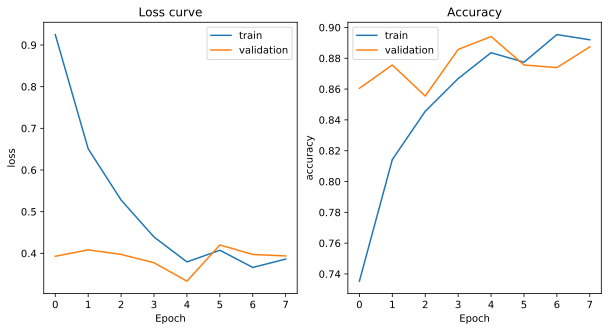

In [85]:
# let's plot the loss and accuracy 

# get the training and validation accuracy from the history object
train_acc = history1.history['accuracy']
valid_acc = history1.history['val_accuracy']

# get the loss
train_loss = history1.history['loss']
valid_loss = history1.history['val_loss']

# get the number of entries
xvalues = np.arange(len(train_acc))

# visualize
f,ax = plt.subplots(1,2, figsize=(10,5))
ax[0].plot(xvalues, train_loss)
ax[0].plot(xvalues, valid_loss)
ax[0].set_title("Loss curve")
ax[0].set_xlabel("Epoch")
ax[0].set_ylabel("loss")
ax[0].legend(['train', 'validation'])

ax[1].plot(xvalues, train_acc)
ax[1].plot(xvalues, valid_acc)
ax[1].set_title("Accuracy")
ax[1].set_xlabel("Epoch")
ax[1].set_ylabel("accuracy")
ax[1].legend(['train', 'validation'])

plt.show()

Appears my validation set is way too small

## Model Interpretability
The most important part. How do we explain the output of our model? For example, given an image, what does the network consider important when classifying the image? Can we get info about it? Can we make our model a little grey box? LOL!

Answering the above question is a bit difficult. Although there have been many advancements in explaining the activations/outputs of a neural network, for example, check this excellent [distill article](https://distill.pub/2018/building-blocks/), a lot more has to be done in this direction.

Here, we will explore two methods that are very simple to use and can give some good insights about model predictions. These are:

* **Visualizing the intermediate layers outputs**
* **[Class Activation Mapping](http://cnnlocalization.csail.mit.edu/)**


We will start by selecting all the layers up to last convolution block in VGG16, excluding the Input layer. Define a new model, `vis_model`, that takes the same input as our model's input but outputs activations of all the intermediate layers we have selected. This will be used for displaying all the activation maps of each convolution block for any sample image from our validation data. 
Check `visualize_intermediate_activations()` function for more details.


For `CAM`, we will take the same sample image and get the output of the last convolution layer. We also compute the gradients for this layer which we will use to generate a heatmap. See the `get_CAM()` function for details.

In [86]:
# select all the layers for which you want to visualize the outputs and store it in a list
outputs = [layer.output for layer in model.layers[1:18]]

# Define a new model that generates the above output
vis_model = tf.keras.Model(model.input, outputs)

# store the layer names we are interested in
layer_names = []
for layer in outputs:
    layer_names.append(layer.name.split("/")[0])

    
print("Layers going to be used for visualization: ")
print(layer_names)

Layers going to be used for visualization: 
['block1_conv1_1', 'block1_conv2_1', 'block1_pool_1', 'block2_conv1_1', 'block2_conv2_1', 'block2_pool_1', 'block3_conv1_1', 'block3_conv2_1', 'block3_conv3_1', 'block3_pool_1', 'block4_conv1_1', 'block4_conv2_1', 'block4_conv3_1', 'block4_pool_1', 'block5_conv1_1', 'block5_conv2_1', 'block5_conv3_1']


In [0]:
def get_CAM(processed_image, predicted_label, layer_name='block5_conv3'):
    """
    This function is used to generate a heatmap for a sample image prediction.
    
    Args:
        processed_image: any sample image that has been pre-processed using the 
                       `preprocess_input()`method of a keras model
        predicted_label: label predicted by the network for this image
    
    Returns:
        heatmap: heatmap generated over the last convolution layer output 
    """
    
    # this will be the model that would give us the graidents
    model_grad = tf.keras.Model([model.inputs], 
                       [model.get_layer(layer_name).output, model.output])
    
    # Gradient tape gives you everything you need
    with tf.GradientTape() as tape:
        conv_output_values, predictions = model_grad(processed_image)
        loss = predictions[:, predicted_label]
    
    # get the gradients wrt to the chosen layer
    grads_values = tape.gradient(loss, conv_output_values)
    
    # take mean gradient per feature map
    grads_values = K.mean(grads_values, axis=(0,1,2))
    
    # convert to numpy. This is done just for image operations.
    # Check for shapes and you would understand why we performed 
    # the squeeze operation here.
    conv_output_values = np.squeeze(conv_output_values.numpy())
    grads_values = grads_values.numpy()
    
    
    # iterate over each feature map in yout conv output and multiply
    # the gradient values with the conv output values. This gives an 
    # indication of "how important a feature is"
    for i in range(512): # we have 512 features in our last conv layer
        conv_output_values[:,:,i] *= grads_values[i]
    
    # create a heatmap
    heatmap = np.mean(conv_output_values, axis=-1)
    
    # remove negative values
    heatmap = np.maximum(heatmap, 0)
    
    # normalize
    heatmap /= heatmap.max()
    
    del model_grad, conv_output_values, grads_values, loss
   
    return heatmap

Update random sample to sample from train_df

In [0]:
def show_random_sample(idx):
    """
    This function is used to select a random sample from the validation dataframe.
    It generates prediction for the same. It also stores the heatmap and the intermediate
    layers activation maps.
    
    Arguments:
        idx: random index to select a sample from validation data
    
    Returns:
        activations: activation values for intermediate layers
    """
    # select the sample and read the corresponding image and label
    sample_image = cv2.imread(train_df.iloc[idx]['filename'])
    sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
    sample_image = cv2.resize(sample_image, (img_rows, img_cols))
    sample_label = train_df.iloc[idx]["genre"]
    
    # pre-process the image
    sample_image_processed = np.expand_dims(sample_image, axis=0)
    sample_image_processed = tf.keras.applications.vgg16.preprocess_input(sample_image_processed)
    
    # generate activation maps from the intermediate layers using the visualization model
    activations = vis_model.predict(sample_image_processed)
    
    # get the label predicted by our original model
    print(model.predict(sample_image_processed))
    pred_label = np.argmax(model.predict(sample_image_processed), axis=-1)[0]
    
    # choose any random activation map from the activation maps 
    sample_activation = activations[0][0,:,:,16]
    
    # normalize the sample activation map
    sample_activation-=sample_activation.mean()
    sample_activation/=sample_activation.std()
    
    # convert pixel values between 0-255
    sample_activation *=255
    sample_activation = np.clip(sample_activation, 0, 255).astype(np.uint8)
    
    
    
    # get the heatmap for class activation map(CAM)
    heatmap = get_CAM(sample_image_processed, pred_label)
    heatmap = cv2.resize(heatmap, (sample_image.shape[0], sample_image.shape[1]))
    heatmap = heatmap *255
    heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    super_imposed_image = heatmap * 0.5 + sample_image
    super_imposed_image = np.clip(super_imposed_image, 0,255).astype(np.uint8)

    f,ax = plt.subplots(2,2, figsize=(15,8))
    ax[0,0].imshow(sample_image)
    ax[0,0].set_title(f"True label: {sample_label} \n Predicted label: {pred_label}")
    ax[0,0].axis('off')
    
    ax[0,1].imshow(sample_activation)
    ax[0,1].set_title("Random feature map")
    ax[0,1].axis('off')
    
    ax[1,0].imshow(heatmap)
    ax[1,0].set_title("Class Activation Map")
    ax[1,0].axis('off')
    
    ax[1,1].imshow(super_imposed_image)
    ax[1,1].set_title("Activation map superimposed")
    ax[1,1].axis('off')
    plt.show()
    
    return activations

Let's visualize **CAM** for some examples now

[[0.9456978  0.05430225]]


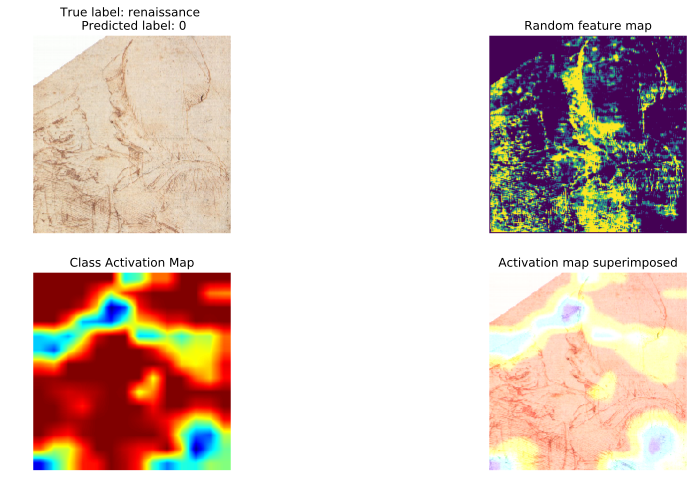

In [89]:
_ = show_random_sample(idx=1)

[[0.14236759 0.8576324 ]]


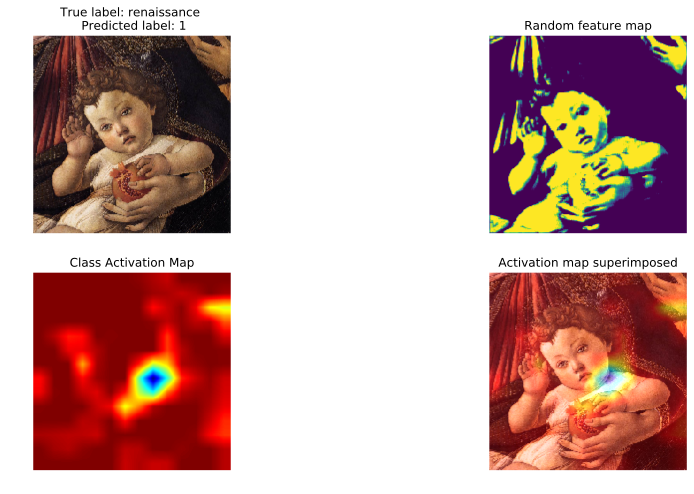

In [90]:
_ = show_random_sample(idx=5)

[[0.8284659  0.17153418]]


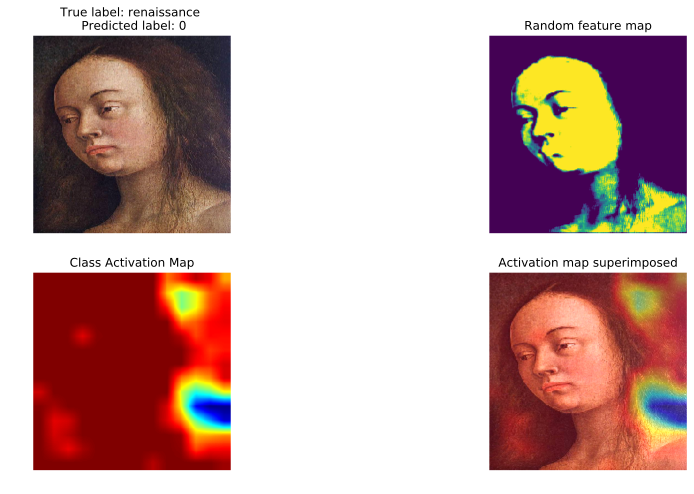

In [91]:
_ = show_random_sample(idx=123)

[[5.3762469e-05 9.9994624e-01]]


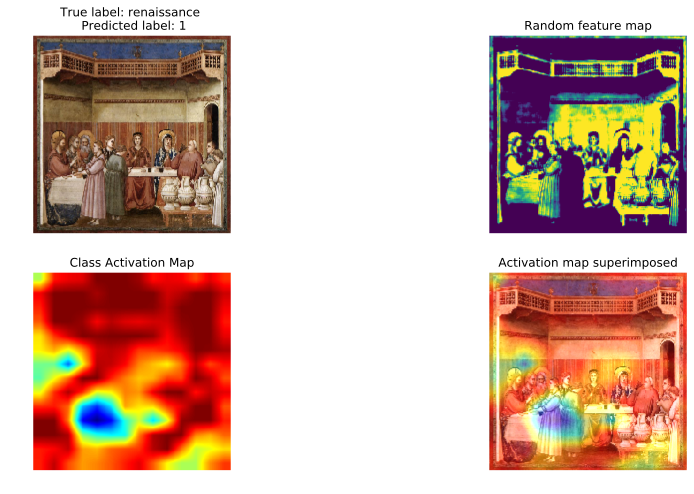

In [92]:
_ = show_random_sample(idx=100)

[[9.9997377e-01 2.6249878e-05]]


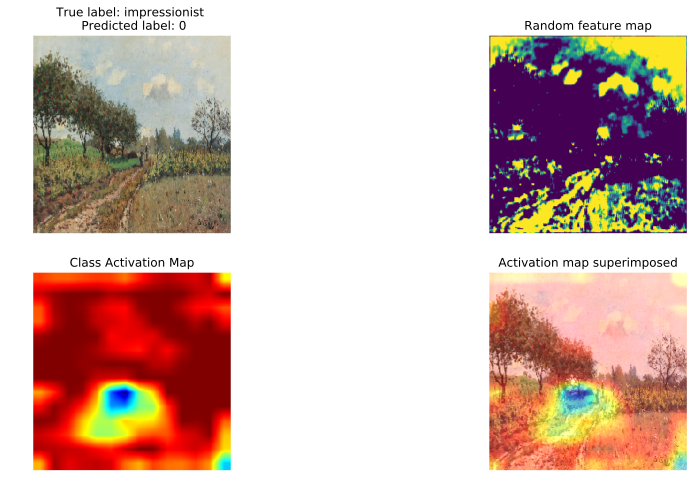

In [96]:
_ = show_random_sample(idx=200)

[[2.412091e-04 9.997588e-01]]


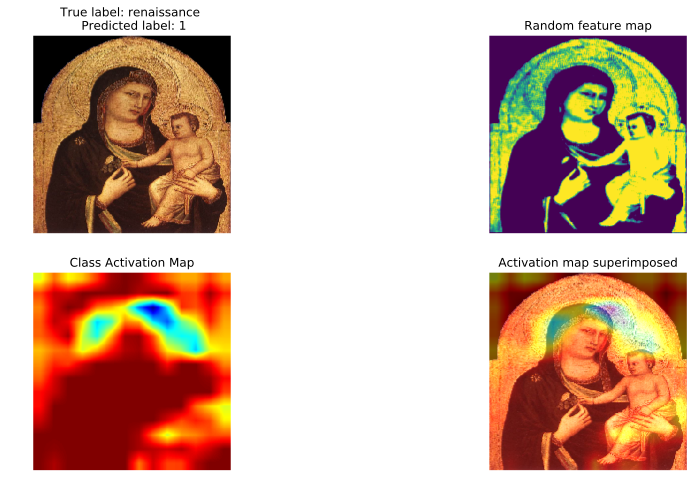

In [97]:
_ = show_random_sample(idx=300)

[[9.9966645e-01 3.3352984e-04]]


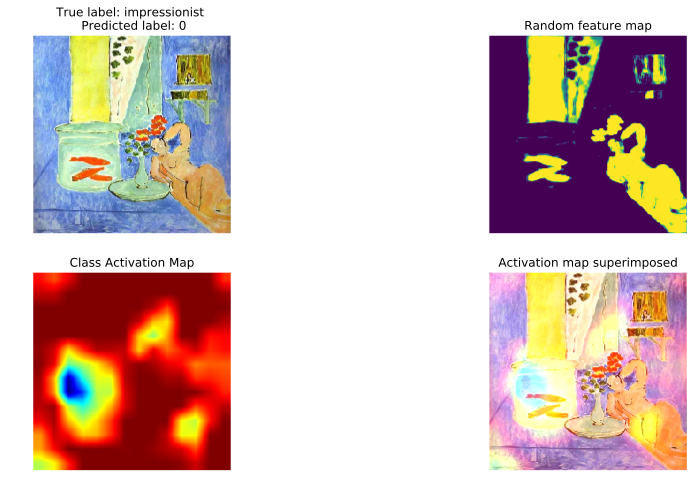

In [98]:
_ = show_random_sample(idx=400)

[[9.9952686e-01 4.7319033e-04]]


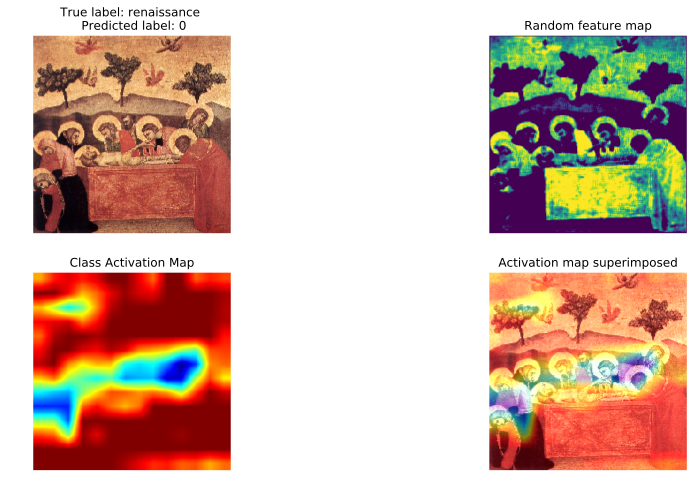

In [99]:
activations = show_random_sample(idx=2000)

### Intermediate layers output visualization

We will take the activations generated for the last sample and check the output
of intermediate layers for visualization

In [0]:
def visualize_intermediate_activations(layer_names, activations):
    """
    This function is used to visualize all the itermediate activation maps
    
    Arguments:
        layer_names: list of names of all the intermediate layers we chose
        activations: all the intermediate activation maps 
    """
    assert len(layer_names)==len(activations), "Make sure layers and activation values match"
    images_per_row=16
    
    for layer_name, layer_activation in zip(layer_names, activations):
        nb_features = layer_activation.shape[-1]
        size= layer_activation.shape[1]

        nb_cols = nb_features // images_per_row
        grid = np.zeros((size*nb_cols, size*images_per_row))

        for col in range(nb_cols):
            for row in range(images_per_row):
                feature_map = layer_activation[0,:,:,col*images_per_row + row]
                feature_map -= feature_map.mean()
                feature_map /= feature_map.std()
                feature_map *=255
                feature_map = np.clip(feature_map, 0, 255).astype(np.uint8)

                grid[col*size:(col+1)*size, row*size:(row+1)*size] = feature_map

        scale = 1./size
        plt.figure(figsize=(scale*grid.shape[1], scale*grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(grid, aspect='auto', cmap='viridis')
    plt.show()

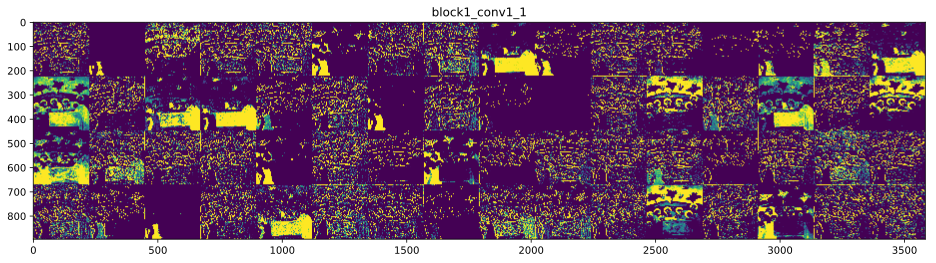

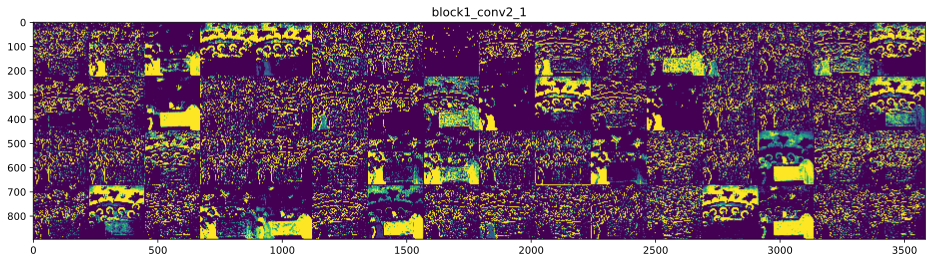

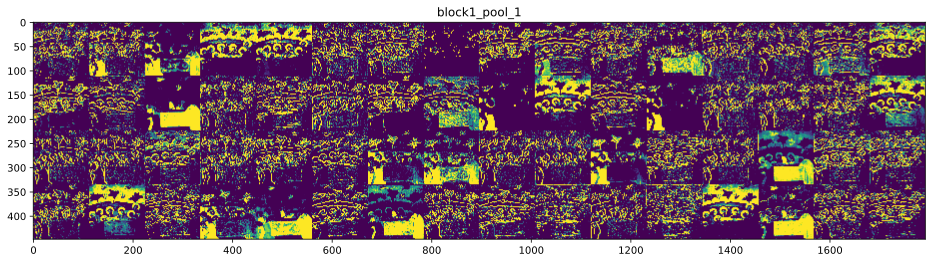

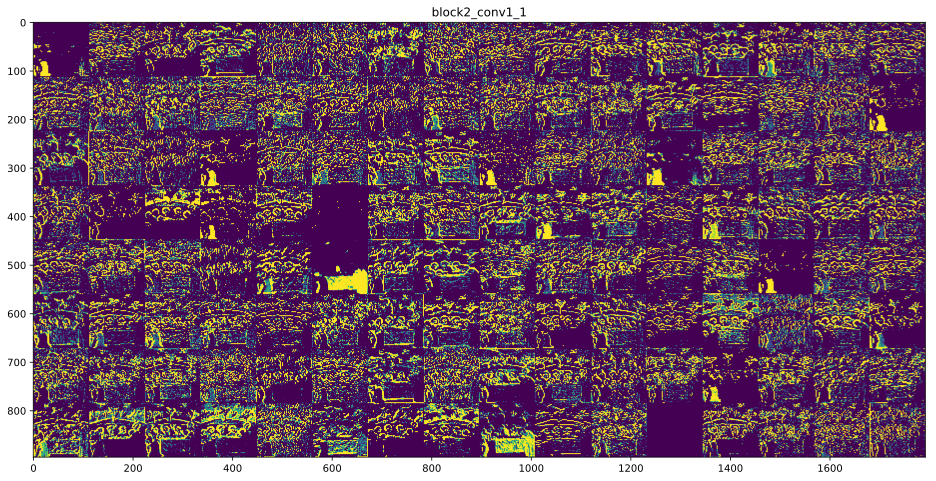

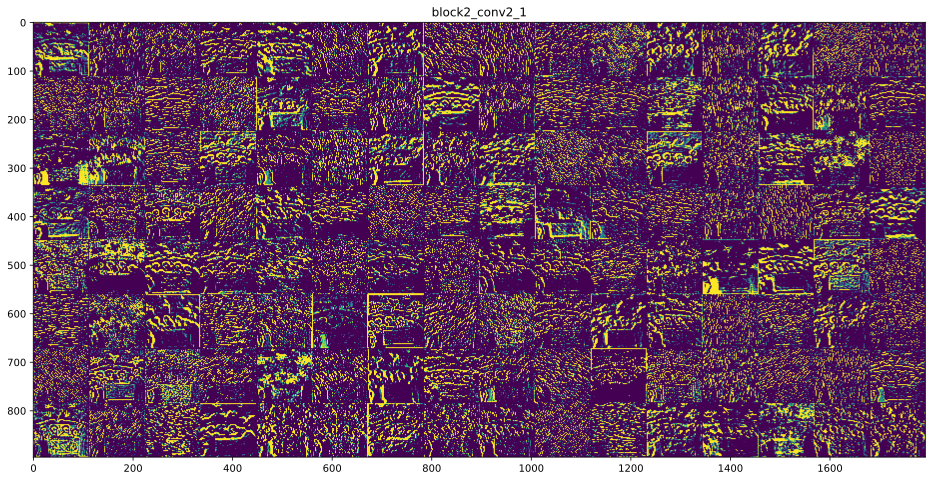

...

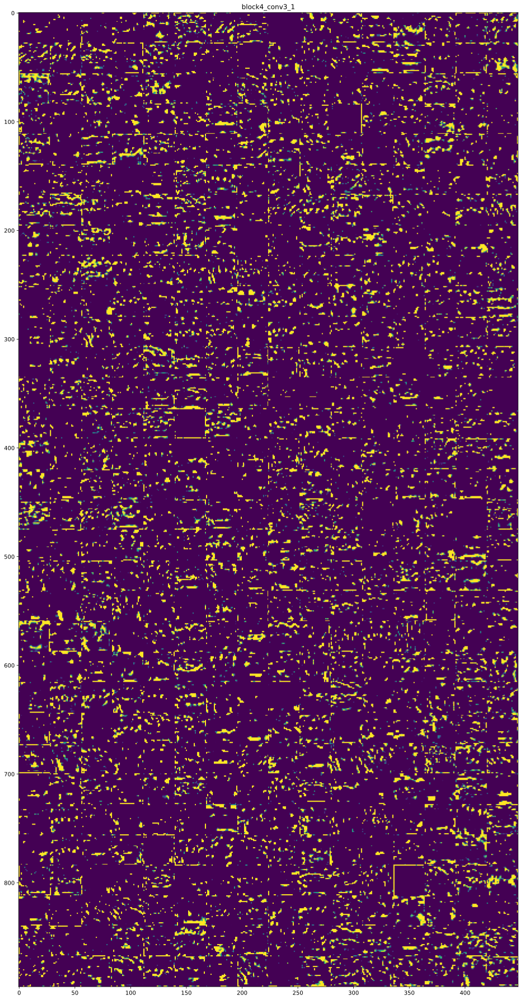

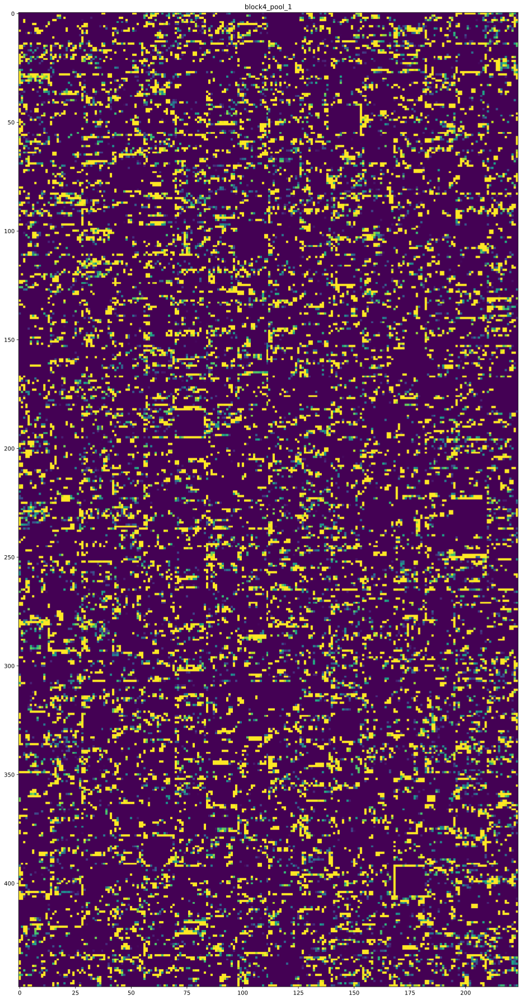

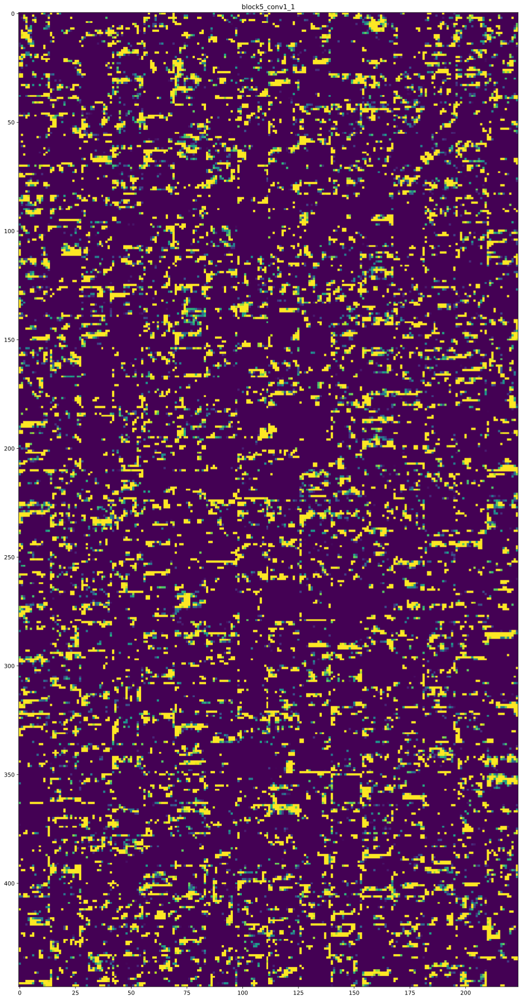

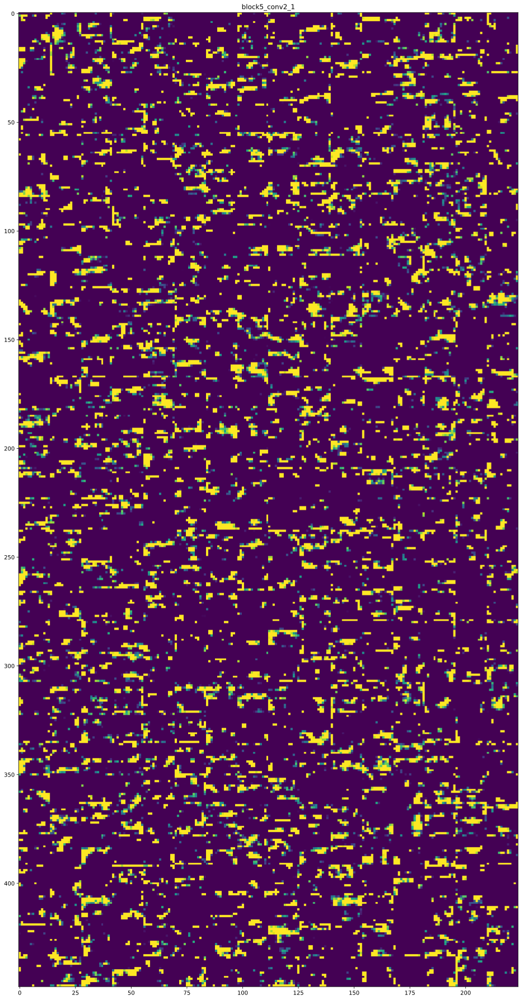

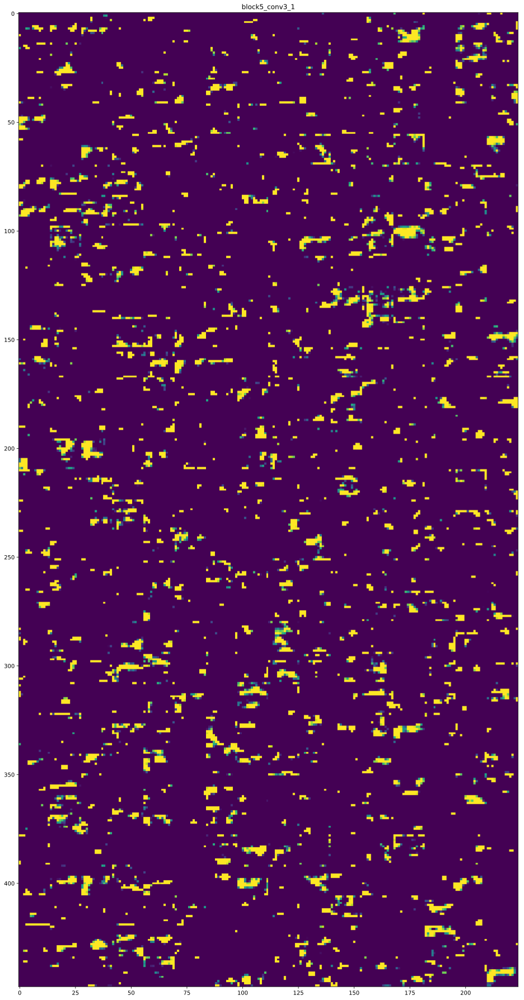

In [101]:
visualize_intermediate_activations(activations=activations, 
                                   layer_names=layer_names)